# Hedonic Regression
Here we investigate the use of explanatory spatial regression methods using spreg to analyise does have a school being near a house increase housing prices using a hedonic framework


## Import Libraries & Packages

In [1]:
# Import required packages
import matplotlib as mpl
from matplotlib import colors

%matplotlib inline
mpl.rcParams['figure.figsize'] = (15, 10) #this increases the inline figure size to 15 tall x 10 wide

import seaborn
import pandas as pd
import geopandas as gpd
import pysal
import numpy as np
import mapclassify
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore') # Change settings so that warnings are not displayed

import contextily as cx
from shapely.geometry import Polygon
from shapely.geometry import Point
import plotly.express as px
from pysal.explore import esda
from pysal.lib import weights
from splot.esda import plot_moran
from splot.esda import moran_scatterplot
from splot.esda import plot_local_autocorrelation
from splot.esda import lisa_cluster
from esda.moran import Moran_Local

# Loading a few new packages
from scipy import stats
from pysal.model import spreg
import statsmodels.formula.api as sm

## Load in our data files TAKES AGES APPROX 90 Seconds

In [2]:
#hp = gpd.read_file('data_opens_3.geojson') #SMALLER DATASET
#hp = gpd.read_file('houses_lr.geojson') # FULL DATASET NEED TO CALCULATE FEATURES

#USE 2017 DATA ONLY ---> LOADS FASTER

import time
t0 = time.time()


#hp = gpd.read_file('hp2017.geojson') #SMALLER DATASET ---> LEAVE TO LOAD LATER
#gpd.read_file('house_prices_2017_calculated_etc.geojson')




oa = gpd.read_file('OutputAreas.geojson')
KM0 = gpd.read_file('KM_Zero.geojson')
lb = gpd.read_file('london_boroughs.geojson')

schools = gpd.read_file('all_schools_xy.csv') #2016 data

t1 = time.time()

total = t1-t0
print(f"took {total} seconds") # Took 91 seconds

took 90.6789939403534 seconds


# Limit to 2017 & SAVE (ALREADY DONE IN hp2017.geojson)

In [ ]:
#hp2017 = hp[(hp["year"] == 2017)]
#hp2017.to_file("hp2017.geojson", driver='GeoJSON')

## Calculate distances TOOK OVER AN HOUR

In [ ]:
### Code for calculating distance variables from scratch:

import time
t0 = time.time()

#hp = gpd.read_file('houses_lr.geojson')
#hp = gpd.read_file('hp2017.geojson')
#road = gpd.read_file('Primary_Roads.geojson')
#opens = gpd.read_file('OpenSpace.geojson')
#transit = gpd.read_file('TransitStations.geojson')

# # We've already filtered for 2017 dataset
# #hp_2017 = hp[(hp["year"]==2017)]


# calc min distance from houses to roads, transit and opens
#hp11 = hp
# hp_roads = hp.geometry.apply(lambda x: road.distance(x).min())
# hp['road_dist'] = hp_roads
# data_transit = hp.geometry.apply(lambda x: transit.distance(x).min())
# hp['Dist_Transit'] = data_transit
# data_opens = hp.geometry.apply(lambda x: opens.distance(x).min())
# hp['Dist_OpenSpace'] = data_opens

# hp.to_file("house_prices_2017_calculated_etc.geojson", driver='GeoJSON')
# t1 = time.time()

# total = t1-t0
print(f"took {total} seconds")

In [5]:
# hp['Dist_Road'] = hp_roads
# data_transit = hp.geometry.apply(lambda x: transit.distance(x).min())
# hp['Dist_Transit'] = data_transit
# data_opens = hp.geometry.apply(lambda x: opens.distance(x).min())
# hp['Dist_OpenSpace'] = data_opens

# hp.to_file("house_prices_2017_calculated_etc.geojson", driver='GeoJSON')

# TOOK 3135 Seconds  =  50 minutes

In [52]:
hp['Dist_Road'] = hp_roads

In [6]:
hp11.tail(5)

,postcode,price,dateoftransfer,propertytype,oldnew,duration,categorytype,recordstatus,year,tfarea,numberrooms,priceper,pcd,pcd2,dointr,doterm,geometry,road_dist,Dist_Transit,Dist_OpenSpace
63496,SW118PP,1040000.0,2017-05-11,F,N,L,A,A,2017.0,79.0,3.0,13164.556962,SW118PP,SW11 8PP,201611.0,NaN,POINT (528632.000 177515.000),420.000005,494.209327,34.778493
63497,IG88BH,237500.0,2017-07-28,F,N,L,A,A,2017.0,46.0,2.0,5163.043478,IG8 8BH,IG8 8BH,198001.0,NaN,POINT (542758.000 191959.000),2122.792506,1488.641888,107.620448
63498,SW118NJ,230000.0,2017-11-08,F,N,L,A,A,2017.0,49.0,2.0,4693.877551,SW118NJ,SW11 8NJ,201611.0,NaN,POINT (528688.000 177523.000),413.309821,493.259989,91.346613
63499,SW118PG,790000.0,2017-07-27,F,N,L,A,A,2017.0,70.0,2.0,11285.714286,SW118PG,SW11 8PG,201611.0,NaN,POINT (528621.000 177594.000),341.177378,573.764700,35.320303
63500,KT64EP,250000.0,2017-01-31,F,N,L,A,A,2017.0,67.0,3.0,3731.343284,KT6 4EP,KT6 4EP,200804.0,NaN,POINT (517818.000 167249.000),1784.040361,281.477991,165.258930


In [ ]:
hp.tail(10)

In [7]:
schools.iloc[0:5]

,FID,OBJECTID,URN,SCHOOL_NAM,TYPE,PHASE,ADDRESS,TOWN,POSTCODE,STATUS,...,NORTHING,WARD_NAME,LA_NAME,WEBLINK,AGE,map_icon,Primary,POINT_X,POINT_Y,geometry
0,0,1.000000000000000,100332,Langford Primary School,Community School,Primary,Gilstead Road,London,SW6 2LG,"Open, but proposed to close",...,176415,Sands End,Hammersmith and Fulham,www.langford.lbhf.sch.uk,3 - 11,STATE-FUNDED,1,-0.188834467803000,51.472703480600003,None
1,1,2.000000000000000,101596,Worsley Bridge Primary School,Community School,Primary,Brackley Road,Beckenham,BR3 1RF,"Open, but proposed to close",...,170426,Copers Cope,Bromley,www.worsleybridge.bromley.sch.uk,4 - 11,STATE-FUNDED,1,-0.026612620834800,51.416226473000002,None
2,2,3.000000000000000,101736,South Norwood Primary School,Community School,Primary,34 Crowther Road,London,SE25 5QP,"Open, but proposed to close",...,168019,Woodside,Croydon,www.southnorwoodprimaryschool.co.uk,4 - 11,STATE-FUNDED,1,-0.073525845668900,51.395361770100003,None
3,3,4.000000000000000,102962,Cheam Common Junior School,Community School,Primary,Kingsmead Avenue,Worcester Park,KT4 8UT,"Open, but proposed to close",...,165542,Nonsuch,Sutton,http://www.cheam-common-jnr.sutton.lgfl.net,7 - 11,STATE-FUNDED,1,-0.237927666676000,51.375673801100000,None
4,4,5.000000000000000,132008,Burwood School,Community Special School,Not applicable,Avalon Road,Orpington,BR6 9BD,"Open, but proposed to close",...,165568,Orpington,Bromley,www.burwood.bromley.sch.uk,7 - 16,SPECIAL,1,0.117760367988000,51.370019884100003,None


# Calculate Distance From Houses to Schools ( TOOK 183 SECONDS)

In [9]:
#hp = gpd.read_file('houses_lr.geojson’)
#transit = gpd.read_file('TransitStations.geojson’)

#import Point
#import pyproj
#from pyproj import CRS, Transformer

#hp17 = hp # This is the all his stuff calculated...

#crs_27700 = CRS("EPSG:27700")
#crs_4326 = CRS("EPSG:4326")

#transformer = Transformer.from_crs(crs_4326, crs_27700, always_xy=True)
#schools['geometry'] = [Point(transformer.transform(lon, lat)) for lon, lat in zip(schools['POINT_X'], schools['POINT_Y'])]

#now calculate distance
#hp_school_dist = hp17.geometry.apply(lambda x: schools.distance(x).min())

#Merge distances back into hp dataset
#hp_with_school_dist = pd.concat([hp17, hp_school_dist.rename("Dist_School")], axis=1)

#hp_with_school_dist = gpd.GeoDataFrame(hp_with_school_dist, geometry='geometry', crs=hp17.crs)

#Export new dataset
# Export the final dataset with calculated distance variables to a new GeoJSON file

# I dont think you need to specify the schema
#hp_with_school_dist.to_file("houses_with_school_distance.geojson", driver='GeoJSON')#, schema={"geometry": "Point", "properties": {"postcode": "str", "price": "float", "dateoftransfer": "str", "propertytype": "str", "oldnew": "str", "duration": "str", "categorytype": "str", "recordstatus": "str", "year": "float", "tfarea": "float", "numberrooms": "float", "priceper": "float", "pcd": "str", "pcd2": "str", "dointr": "float", "doterm": "float", "Dist_School": "float"}})

# Print last 10
hp_with_school_dist.tail(10)

,postcode,price,dateoftransfer,propertytype,oldnew,duration,categorytype,recordstatus,year,tfarea,...,priceper,pcd,pcd2,dointr,doterm,geometry,road_dist,Dist_Transit,Dist_OpenSpace,Dist_School
63491,SW1W9NX,960600.0,2017-09-29,T,N,F,A,A,2017.0,162.0,...,5929.629630,SW1W9NX,SW1W 9NX,198001.0,NaN,POINT (528535.000 178873.000),493.811703,149.635769,243.649259,297.268693
63492,W24AW,1700000.0,2017-03-07,T,N,F,A,A,2017.0,112.0,...,15178.571429,W2 4AW,W2 4AW,198001.0,NaN,POINT (525773.000 180750.000),873.000002,75.637373,186.975709,73.581169
63493,SW118QQ,665000.0,2017-12-20,F,N,L,A,A,2017.0,48.0,...,13854.166667,SW118QQ,SW11 8QQ,201611.0,NaN,POINT (528644.000 177426.000),421.260917,404.772032,34.028775,509.830935
63494,SW118NU,1400000.0,2017-10-30,F,N,L,A,A,2017.0,111.0,...,12612.612613,SW118NU,SW11 8NU,201611.0,NaN,POINT (528621.000 177594.000),341.177378,573.764700,35.320303,609.773608
63495,SW118NR,975000.0,2017-11-10,F,N,L,A,A,2017.0,87.0,...,11206.896552,SW118NR,SW11 8NR,201611.0,NaN,POINT (528686.000 177623.000),313.312953,593.004945,74.021403,543.135361
63496,SW118PP,1040000.0,2017-05-11,F,N,L,A,A,2017.0,79.0,...,13164.556962,SW118PP,SW11 8PP,201611.0,NaN,POINT (528632.000 177515.000),420.000005,494.209327,34.778493,595.619239
63497,IG88BH,237500.0,2017-07-28,F,N,L,A,A,2017.0,46.0,...,5163.043478,IG8 8BH,IG8 8BH,198001.0,NaN,POINT (542758.000 191959.000),2122.792506,1488.641888,107.620448,494.753059
63498,SW118NJ,230000.0,2017-11-08,F,N,L,A,A,2017.0,49.0,...,4693.877551,SW118NJ,SW11 8NJ,201611.0,NaN,POINT (528688.000 177523.000),413.309821,493.259989,91.346613,583.130183
63499,SW118PG,790000.0,2017-07-27,F,N,L,A,A,2017.0,70.0,...,11285.714286,SW118PG,SW11 8PG,201611.0,NaN,POINT (528621.000 177594.000),341.177378,573.764700,35.320303,609.773608
63500,KT64EP,250000.0,2017-01-31,F,N,L,A,A,2017.0,67.0,...,3731.343284,KT6 4EP,KT6 4EP,200804.0,NaN,POINT (517818.000 167249.000),1784.040361,281.477991,165.258930,334.981821


First, let's transform three of the categorical variables into dummy variables (which take 1 or 0 as their values) so that they can be easily modeled in a regression:

# REGRESSION - PRICE ~ Dist_School

In [17]:
hp_with_school_dist_file = gpd.read_file("houses_with_school_distance.geojson")
hp_with_school_dist_file.tail(10)

,postcode,price,dateoftransfer,propertytype,oldnew,duration,categorytype,recordstatus,year,tfarea,...,priceper,pcd,pcd2,dointr,doterm,road_dist,Dist_Transit,Dist_OpenSpace,Dist_School,geometry
63491,SW1W9NX,960600.0,2017-09-29,T,N,F,A,A,2017.0,162.0,...,5929.629630,SW1W9NX,SW1W 9NX,198001.0,NaN,493.811703,149.635769,243.649259,297.268693,POINT (528535.000 178873.000)
63492,W24AW,1700000.0,2017-03-07,T,N,F,A,A,2017.0,112.0,...,15178.571429,W2 4AW,W2 4AW,198001.0,NaN,873.000002,75.637373,186.975709,73.581169,POINT (525773.000 180750.000)
63493,SW118QQ,665000.0,2017-12-20,F,N,L,A,A,2017.0,48.0,...,13854.166667,SW118QQ,SW11 8QQ,201611.0,NaN,421.260917,404.772032,34.028775,509.830935,POINT (528644.000 177426.000)
63494,SW118NU,1400000.0,2017-10-30,F,N,L,A,A,2017.0,111.0,...,12612.612613,SW118NU,SW11 8NU,201611.0,NaN,341.177378,573.764700,35.320303,609.773608,POINT (528621.000 177594.000)
63495,SW118NR,975000.0,2017-11-10,F,N,L,A,A,2017.0,87.0,...,11206.896552,SW118NR,SW11 8NR,201611.0,NaN,313.312953,593.004945,74.021403,543.135361,POINT (528686.000 177623.000)
63496,SW118PP,1040000.0,2017-05-11,F,N,L,A,A,2017.0,79.0,...,13164.556962,SW118PP,SW11 8PP,201611.0,NaN,420.000005,494.209327,34.778493,595.619239,POINT (528632.000 177515.000)
63497,IG88BH,237500.0,2017-07-28,F,N,L,A,A,2017.0,46.0,...,5163.043478,IG8 8BH,IG8 8BH,198001.0,NaN,2122.792506,1488.641888,107.620448,494.753059,POINT (542758.000 191959.000)
63498,SW118NJ,230000.0,2017-11-08,F,N,L,A,A,2017.0,49.0,...,4693.877551,SW118NJ,SW11 8NJ,201611.0,NaN,413.309821,493.259989,91.346613,583.130183,POINT (528688.000 177523.000)
63499,SW118PG,790000.0,2017-07-27,F,N,L,A,A,2017.0,70.0,...,11285.714286,SW118PG,SW11 8PG,201611.0,NaN,341.177378,573.764700,35.320303,609.773608,POINT (528621.000 177594.000)
63500,KT64EP,250000.0,2017-01-31,F,N,L,A,A,2017.0,67.0,...,3731.343284,KT6 4EP,KT6 4EP,200804.0,NaN,1784.040361,281.477991,165.258930,334.981821,POINT (517818.000 167249.000)


Check distribution of price because for linear regression we want better fit by transforming variables by taking log

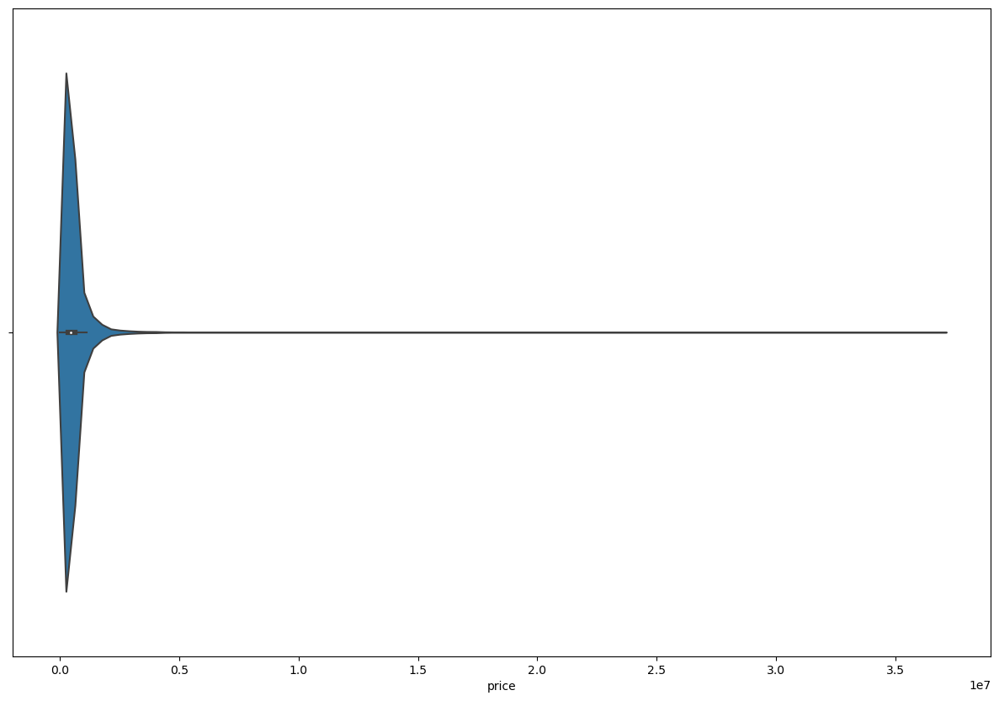

In [53]:
bx = seaborn.violinplot(x=hp_with_school_dist_file["price"])

price is right-skewed so we transform it by taking log to get better fit

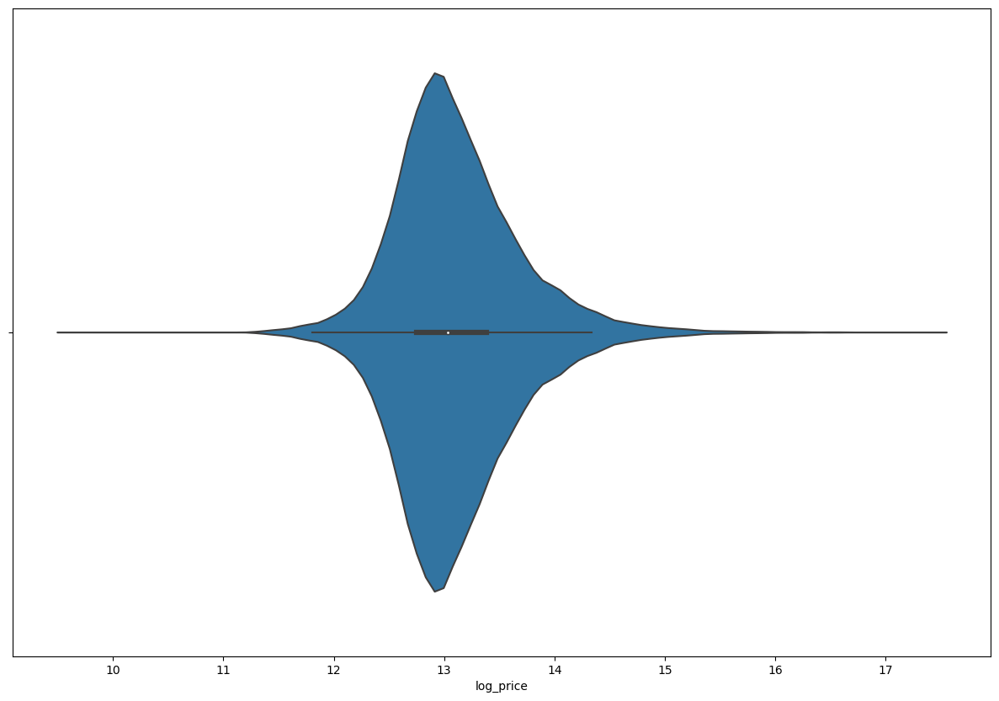

In [54]:
hp_with_school_dist_file['log_price'] = np.log(hp_with_school_dist_file['price'])
bx = seaborn.violinplot(x=hp_with_school_dist_file["log_price"])

# School Distance (Dist_School variable)

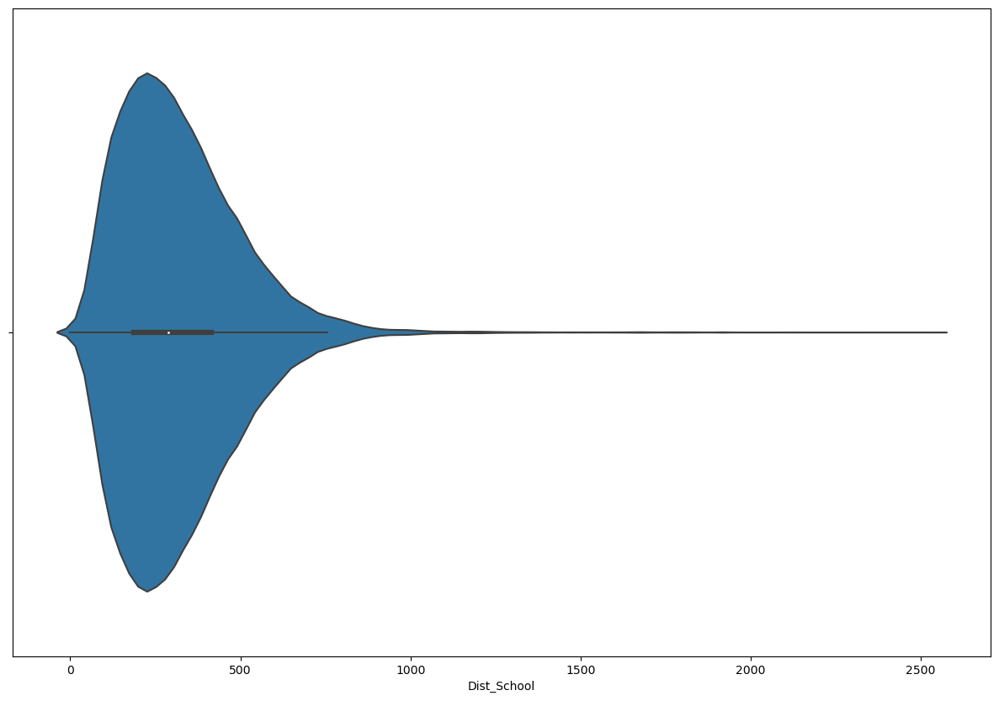

In [55]:
bx = seaborn.violinplot(x=hp_with_school_dist_file["Dist_School"])

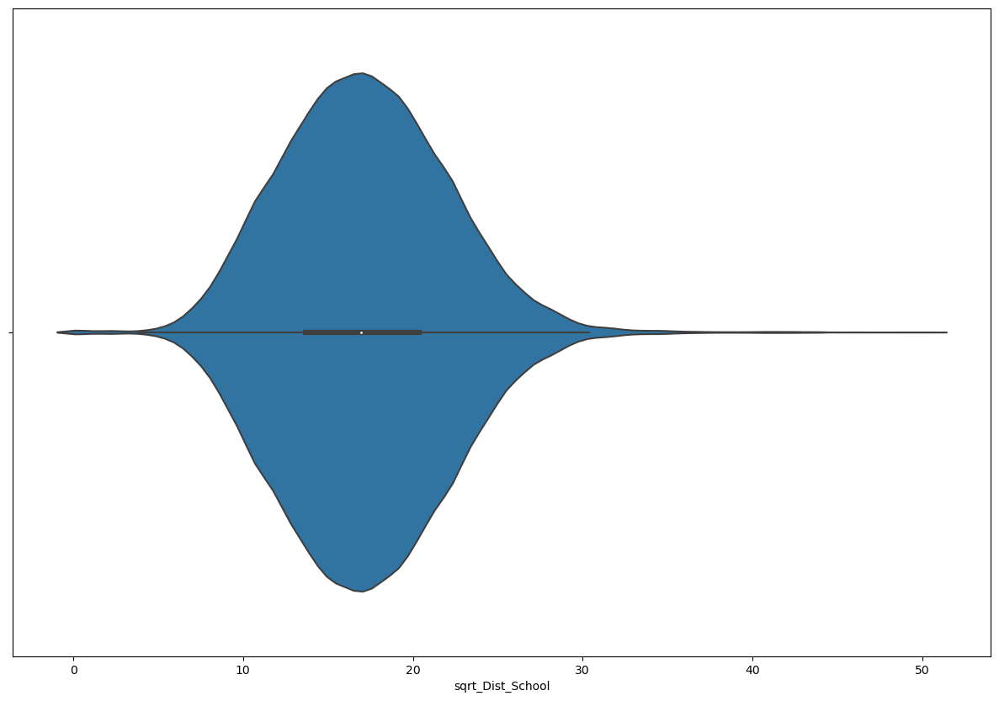

In [56]:
hp_with_school_dist_file['sqrt_Dist_School'] = np.sqrt(hp_with_school_dist_file['Dist_School'])
bx = seaborn.violinplot(x=hp_with_school_dist_file["sqrt_Dist_School"])

Now we have better fit, so we run regression using ```spreg``` on $Y$ and $X$ variables.

First we build covariates

In [57]:
variable_names = ['sqrt_Dist_School']

Preform regression of log_price ~ Distance to school 

In [58]:
m1 = spreg.OLS(hp_with_school_dist_file[['log_price']].values, hp_with_school_dist_file[variable_names].values,
                name_y='log_price', name_x=variable_names, robust='white')
print(m1.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :   log_price                Number of Observations:       63501
Mean dependent var  :     13.1055                Number of Variables   :           2
S.D. dependent var  :      0.5654                Degrees of Freedom    :       63499
R-squared           :      0.0050
Adjusted R-squared  :      0.0050
Sum squared residual:     20195.9                F-statistic           :    317.5574
Sigma-square        :       0.318                Prob(F-statistic)     :   7.343e-71
S.E. of regression  :       0.564                Log likelihood        :  -53731.370
Sigma-square ML     :       0.318                Akaike info criterion :  107466.741
S.E of regression ML:      0.5640                Schwarz criterion     :  107484.858

White Standard Errors
--------------------------------------

## Summary of Output
R-squared, which tells us the % of overall variance in $Y$ explained by the covariates that we included in this model.
R-square is very low 0.0050, telling us less than 0.5% of variance in housing prices is explained by the distance to a school.

Adjusted R-squared discounts the raw R-squared by taking into account the number of variables (because models with more covariates tend to have higher R-squareds simply as a by-product of having more information included to make a prediction), and is generally the one to use when evaluating models. 

Because we only have a small number of variables the Adjusted R-squared = R-squared = 0.0050 

The Coefficient or slope of School_Distance = -0.00817, which can be interpreted as for a 1 unit increase in the distance to the school, we expect the mean price of a house to decreases by 0.00817 while holding all other variables constant. But since our dependent value (Price) is logged we need to take exponential to back-transform 

In [59]:
np.exp(-0.00817) - 1

-0.008136716254412812

So based on the model the percentage change is -0.0081 which means we can expect an approximate 1% decrease in the price of a house for 1 unit increase in the distance.

We extract "t-Statistic" and "probability" columns from the middle section of the report. The t-value (used, as opposed to a $z$-score, when we don't know the population mean or standard deviation, as is the case in most empirical regression analysis) is a measure of the ratio of "signal" to "noise", i.e., the difference between the estimated regression coefficient and 0 (being the null hypothesis in a situation where we don't know the "true" coefficient) - the "signal" - divided by the standard error of the coefficient (essentially a measure of the coefficient's variation) - the "noise". We can find this simply by dividing the estimated coefficient (because the null hypothesis is 0) by the standard error for, e.g., 'sqrt_price':

In [60]:
-0.00817/0.00046

-17.76086956521739

Idea is to provide a number associated with how confident we are that this coefficient value is different than 0. If the coefficient is very large but the error around the estimate is also large (i.e., we have a large estimate but it varies a lot from case to case), then we will have low confidence that the predicted coefficient is different than 0 (thus a low $t$-value). In that way, the significance of your coefficient estimate is a function of 

1) actual effect of the independent variable,
2) variation in the relationship of the independent variable to the dependent variable, and
3) the sample size.

A large $t$-value corresponds to a small probability ($p$-value) that the coefficient is equal to 0 (the null hypothesis); basically, the $p$-value is a comparison the $t$-value to the [*Student's t distribution*](https://www.itl.nist.gov/div898/handbook/eda/section3/eda3672.htm) to determine what % of values are "more extreme" than the estimated $t$-value. This varies by degrees of freedom in the model - with three degrees of freedom, a $t$-value of 10.215 is more extreme that 0.999% of values in the distribution (and thus would have a corresponding $p$-value of .001); but as degrees of freedom (i.e., sample size) increase, $t$-value threshold for given critical values also decreases. With large samples, $t$-values of 2.326 are more extreme than 0.99% of values in the Student's $t$ distribution.

OK, so what does it all mean? Generally you want to set a critical $p$-value for rejecting/not rejecting the null hypothesis before you run your regression - the most common value is 0.05, but there are good reasons to select higher or lower values, depending on your data (critically, on your sample size). The $p$-value, then, is an estimate of the probability that the model's regression coefficient is not actually different than 0. If it is below the set threshold, we talk about the coefficient being a "statistically-significant" predictor of $Y$, but there are again good reasons to take $p$-values with a grain of salt and use more nuanced terms such as "interesting" values, or to discuss "high confidence" that the result is significant, etc. In our case - in this specification, at least - every variable seems to be highly-significant for predicting variation in housing price.


### Summary of Output: Bottom Section
The ```MULTICOLLINEARITY CONDITION NUMBER``` is a test of the collinearity between covariates -

In our model it is 7.152, suggests that there is significant multicollinearity involving the corresponding predictor. This level of VIF indicates that the variance (or the standard error) of the regression coefficient for this predictor is about 7.152 times larger than it would be if that predictor were completely uncorrelated with the other predictors in the model but this is also to be expected based on the framework of the hedonic model.

The ```Jarque-Bera``` statistics provides a test on the normality of errors of our model - in this case it is highly-significant, meaning that the errors are significantly *not* normally-distributed. Since we have already logged a few of our variables to provide a more linear fit, the next step is to include additional factors - including spatial variables - that might improve the normality of the model errors. 

And finally, the ```Breusch-Pagan``` and ```Koenker-Bassett``` statistics test for heteroskedasticity. Again, in this case, both are significant, which indicates that the use of the ```robust='white``` parameter in the ```spreg``` call to use White's robust standard errors is justified. While these values remain significant, unfortunately ```spreg``` does not include additional options for standard error correction, and we will have to be content with watching the value of these test statistics themselves increase or decrease with future specifications.

## Spatial Structure
One way to interrogate these model diagnostics - and particularly the non-normality of the errors - further is to try to understand if spatial structure is playing a hidden role in determining variation in $Y$. In our current specification, we haven't included any information about neighborhood or any of the contextual urban factors that play a significant role in determining property values (a beautiful, new, gigantic mansion located next to an industrial site that pollutes the air will not be worth the same as it would be in a quiet residential neighborhood).

One way to examine this (and to help explain the non-normality of the model errors) is to look at clustering in the model errors by neighborhood. To do this, let's spatially join the 2011 housing points to the Output Areas (in which I have embedded the name of the borough that each Output Area is located within):

The idea is to provide a number associated with how confident we are that this coefficient value is different than 0. If the coefficient is very large but the error around the estimate is also large (i.e., we have a large estimate but it varies a lot from case to case), then we will have low confidence that the predicted coefficient is different than 0 (thus a low -value). In that way, the significance of your coefficient estimate is a function of 1) actual effect of the independent variable, 2) variation in the relationship of the independent variable to the dependent variable, and 3) the sample size. A large -value corresponds to a small probability (-value) that the coefficient is equal to 0 (the null hypothesis); basically, the -value is a comparison the -value to the Student's t distribution to determine what % of values are "more extreme" than the estimated -value. This varies by degrees of freedom in the model - with three degrees of freedom, a -value of 10.215 is more extreme that 0.999% of values in the distribution (and thus would have a corresponding -value of .001); but as degrees of freedom (i.e., sample size) increase, -value threshold for given critical values also decreases. With large samples, -values of 2.326 are more extreme than 0.99% of values in the Student's

distribution.

OK, so what does it all mean? Generally you want to set a critical
-value for rejecting/not rejecting the null hypothesis before you run your regression - the most common value is 0.05, but there are good reasons to select higher or lower values, depending on your data (critically, on your sample size). The -value, then, is an estimate of the probability that the model's regression coefficient is not actually different than 0. If it is below the set threshold, we talk about the coefficient being a "statistically-significant" predictor of , but there are again good reasons to take

-values with a grain of salt and use more nuanced terms such as "interesting" values, or to discuss "high confidence" that the result is significant, etc. In our case - in this specification, at least - every variable seems to be highly-significant for predicting variation in housing price.


## Summary of Output: Bottom Section

Finally, at the bottom of the report we have the results of several diagnostic tests. The MULTICOLLINEARITY CONDITION NUMBER is a test of the collinearity between covariates - generally 45.585 is quite a high value, but this is also to be expected based on the framework of the hedonic model (number of rooms will tend to be highly-correlated with house size, for instance). While multicollinearity in the predictors can bias the coefficient estimates, cause swings in positive/negative signs, and create significant difficulties in interpretation (if two variables are almost entirely correlated, what does it mean for one coefficient to represent variation in Y
holding constant almost all of its own variation that is embodied in the other collinear variable?), the problem also has to be weighed against ommitted variable bias, which occurs when important predictors of Y

are left out of the model entirely. In our case, given the well-established nature of the hedonic model, we will sit tight with our multicollinearity condition value and observe if it swings up wildly from here with additional covariates. The Jarque-Bera statistics provides a test on the normality of errors of our model - in this case it is highly-significant, meaning that the errors are significantly not normally-distributed. Since we have already logged a few of our variables to provide a more linear fit, the next step is to include additional factors - including spatial variables - that might improve the normality of the model errors. And finally, the Breusch-Pagan and Koenker-Bassett statistics test for heteroskedasticity. Again, in this case, both are significant, which indicates that the use of the robust='white parameter in the spreg call to use White's robust standard errors is justified. While these values remain significant, unfortunately spreg does not include additional options for standard error correction, and we will have to be content with watching the value of these test statistics themselves increase or decrease with future specifications.


## Spatial Structure

One way to interrogate these model diagnostics - and particularly the non-normality of the errors - further is to try to understand if spatial structure is playing a hidden role in determining variation in

. In our current specification, we haven't included any information about neighborhood or any of the contextual urban factors that play a significant role in determining property values (a beautiful, new, gigantic mansion located next to an industrial site that pollutes the air will not be worth the same as it would be in a quiet residential neighborhood).

One way to examine this (and to help explain the non-normality of the model errors) is to look at clustering in the model errors by neighborhood. To do this, let's spatially join the 2011 housing points to the Output Areas (in which I have embedded the name of the borough that each Output Area is located within):

In [61]:
hp = hp_with_school_dist_file

In [62]:
hp2 = gpd.sjoin(hp,oa)
pd.set_option('display.max_columns', None)
hp2.head()

,postcode,price,dateoftransfer,propertytype,oldnew,duration,categorytype,recordstatus,year,tfarea,numberrooms,priceper,pcd,pcd2,dointr,doterm,road_dist,Dist_Transit,Dist_OpenSpace,Dist_School,geometry,log_price,sqrt_Dist_School,dist_road,Dist_Road,index_right,geo_code,label,NAME_2,POP,POPDENS,HH,HECTARES,DEPRHH,EMPRES,STUDENT,PROFSCI,Trees,TreeDens
0,CR30EA,252000.0,2017-10-26,T,N,F,A,A,2017.0,68.00,4.0,3705.882353,CR3 0EA,CR3 0EA,198001.0,NaN,15.207139,497.833044,293.701585,274.606198,POINT (533695.000 158978.000),12.437184,16.571246,15.207139,15.207139,18358,E00005337,E92000001E09000008E00005337,Croydon,301.0,20.35159,119.0,14.79,0.478992,158,0.050926,0.097561,0.0,0.000000
13649,CR30EA,315000.0,2017-04-06,T,N,F,A,A,2017.0,77.00,4.0,4090.909091,CR3 0EA,CR3 0EA,198001.0,NaN,15.207139,497.833044,293.701585,274.606198,POINT (533695.000 158978.000),12.660328,16.571246,15.207139,15.207139,18358,E00005337,E92000001E09000008E00005337,Croydon,301.0,20.35159,119.0,14.79,0.478992,158,0.050926,0.097561,0.0,0.000000
14819,CR30EA,315000.0,2017-07-24,T,N,F,A,A,2017.0,73.85,3.0,4265.402844,CR3 0EA,CR3 0EA,198001.0,NaN,15.207139,497.833044,293.701585,274.606198,POINT (533695.000 158978.000),12.660328,16.571246,15.207139,15.207139,18358,E00005337,E92000001E09000008E00005337,Croydon,301.0,20.35159,119.0,14.79,0.478992,158,0.050926,0.097561,0.0,0.000000
1,EC2Y8DD,1775000.0,2017-01-16,F,N,L,A,A,2017.0,106.03,5.0,16740.545129,EC2Y8DD,EC2Y 8DD,198001.0,NaN,641.116330,366.098660,9.839361,128.081099,POINT (532418.000 181908.000),14.389311,11.317292,641.116330,641.116330,12125,E00000017,E92000001E41000324E00000017,City of London,290.0,171.59760,142.0,1.69,0.330986,158,0.071429,0.356250,8.0,4.733728
78,EC2Y8NB,1950000.0,2017-10-06,F,N,L,A,A,2017.0,114.00,4.0,17105.263158,EC2Y8NB,EC2Y 8NB,199208.0,NaN,641.116330,366.098660,9.839361,128.081099,POINT (532418.000 181908.000),14.483340,11.317292,641.116330,641.116330,12125,E00000017,E92000001E41000324E00000017,City of London,290.0,171.59760,142.0,1.69,0.330986,158,0.071429,0.356250,8.0,4.733728


And then plot the distribution of residuals by borough:

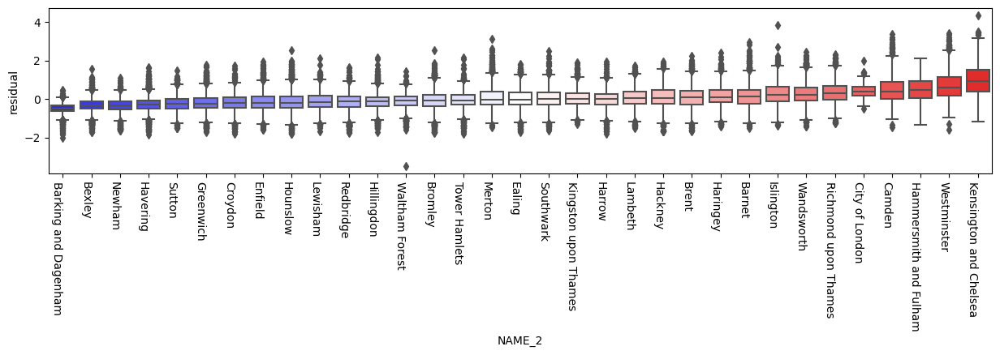

In [63]:
hp2['residual'] = m1.u
medians = hp2.groupby("NAME_2").residual.median().to_frame('hood_residual')

f = plt.figure(figsize=(15,3))
ax = plt.gca()
seaborn.boxplot(
    x='NAME_2', 
    y='residual', 
    ax = ax,
    data=hp2.merge(
        medians, how='left', left_on='NAME_2', right_index=True
    ).sort_values('hood_residual'), 
    palette='bwr',
)
# Rotate the X labels for legibility
f.autofmt_xdate(rotation=-90)
plt.show()

There is significant variation in how the model is working by neighborhood! Neighborhoods on the left of the scale have consistently lower observed values of housing price than the model would predict based on their raw housing characteristics (i.e., negative residuals), and neighborhoods on the right have consistently higher values than the model would predict (i.e., positive residuals). 

Why might that be? It appears that a lot of the boroughs on the high and low end of the residual spectrum are close to one another in space. We can test this explicitly by creating a distance-based spatial weights matrix and generating spatial lags of the residuals:

In [64]:
w = weights.DistanceBand.from_dataframe(hp2, 500) # Weights based on features within 500 meters

And then correlating these spatially-lagged residuals with the residuals of the model in their origin locations:

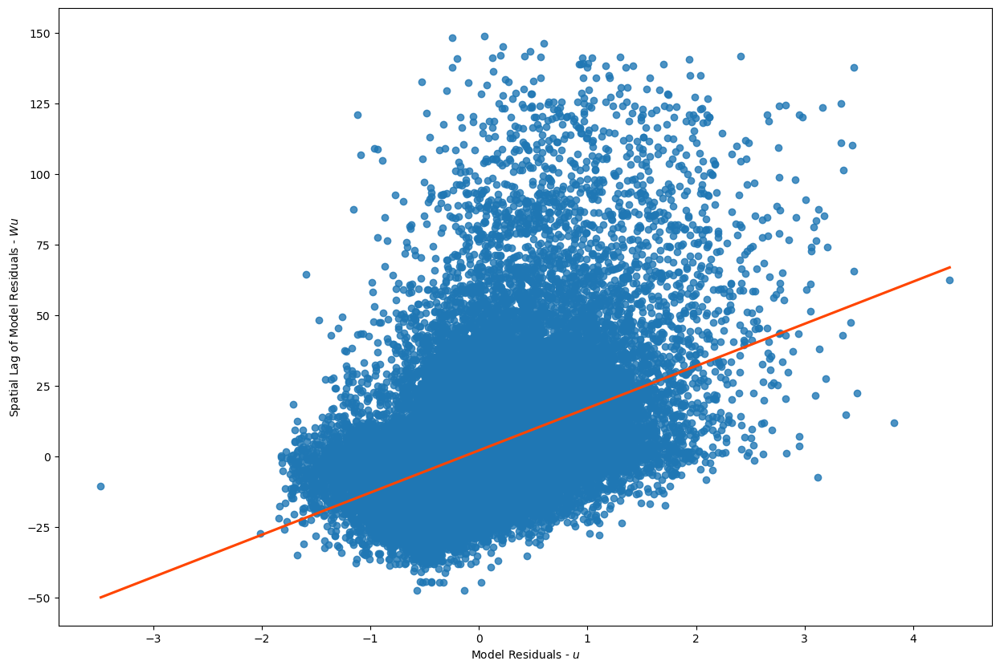

In [65]:
lag_residual = weights.spatial_lag.lag_spatial(w, m1.u)
ax = seaborn.regplot(
    x=m1.u.flatten(),
    y=lag_residual.flatten(),
    line_kws=dict(color='orangered'),
    ci=None,
)
ax.set_xlabel('Model Residuals - $u$')
ax.set_ylabel('Spatial Lag of Model Residuals - $W u$');

This is basically a Moran's I plot of the model residuals, and we can see from the regression line that there is a pretty large positive correlation between the residuals of the model in a given point and the residuals of the model in its neighbors. Thus we can see pretty clearly that the prediction errors are clustering! Not only is this a violation of the core OLS assumption, but it can also perhaps help us infer that there are spatial processes structuring the relationship of the variables we've chosen to housing price.

We can even plot a local Moran's I map of local outliers of prediction error. Here, red points correspond to "high-high" spatial clusters of positive residuals, while blue points correspond to "low-low" spatial clusters of negative residuals:

('WARNING: ', 2236, ' is an island (no neighbors)')
('WARNING: ', 2274, ' is an island (no neighbors)')
('WARNING: ', 3974, ' is an island (no neighbors)')
('WARNING: ', 5355, ' is an island (no neighbors)')
('WARNING: ', 7626, ' is an island (no neighbors)')
('WARNING: ', 10071, ' is an island (no neighbors)')
('WARNING: ', 11891, ' is an island (no neighbors)')
('WARNING: ', 8360, ' is an island (no neighbors)')
('WARNING: ', 9846, ' is an island (no neighbors)')
('WARNING: ', 10854, ' is an island (no neighbors)')
('WARNING: ', 11453, ' is an island (no neighbors)')
('WARNING: ', 11715, ' is an island (no neighbors)')
('WARNING: ', 8458, ' is an island (no neighbors)')
('WARNING: ', 9404, ' is an island (no neighbors)')
('WARNING: ', 8476, ' is an island (no neighbors)')
('WARNING: ', 11407, ' is an island (no neighbors)')
('WARNING: ', 8517, ' is an island (no neighbors)')
('WARNING: ', 8676, ' is an island (no neighbors)')
('WARNING: ', 8738, ' is an island (no neighbors)')
('WARN

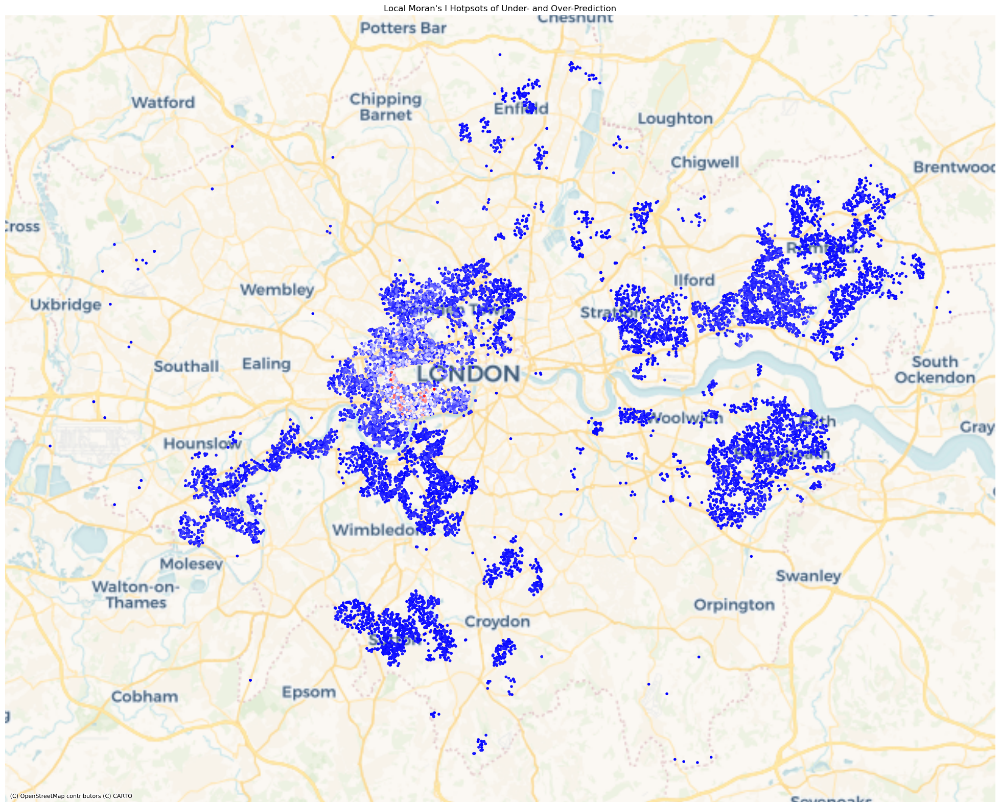

In [66]:
outliers = esda.moran.Moran_Local(m1.u, w, permutations=999)
error_clusters = (outliers.q % 2 == 1) # only the cluster cores
error_clusters &= (outliers.p_sim <= .001) # filtering out non-significant clusters
f, ax = plt.subplots(1, figsize=(25, 20)) #Subplots allows you to draw multiple plots in one figure
hp2.assign(error_clusters = error_clusters,
          local_I = outliers.Is)\
  .query("error_clusters")\
  .sort_values('local_I')\
  .to_crs('EPSG:3857').plot('local_I', cmap='bwr', marker='.', ax=ax)
ax.set_title("Local Moran's I Hotpsots of Under- and Over-Prediction")
ax.set_axis_off() #Remove axes from plot 
plt.axis('equal') #Set x and y axes to be equal size
cx.add_basemap(ax, source=cx.providers.CartoDB.Voyager)

we see that there is a really consistent geography to the pattern of over- and under-prediction!

In [67]:
## Spatial Heterogeneity and Fixed Effects

Without a pre-conceived notion of what might be structuring these errors, one way to better control for the heterogenous relationships between the predictor variables and housing price by neighborhood is just to insert dummy variables for each borough directly in the regression model as 'fixed effects'. These fixed effects then control for all of the unobserved variation (outside of the other covariates) associated with each borough, and can be a very useful way to observe heterogeneity in relationships across space. To do this, we'll use ```statsmodels``` to build the equation, because we're using non-spatial regressions and it has an easier interface in which to enter the equation directly (you may have to install this package in the terminal if you don't have it already). First we build the equation:

In [68]:
f = 'log_price ~ ' + ' + '.join(variable_names) + ' + NAME_2 - 1' # Remove intercept (-1) in this fixed effects model
print(f)

log_price ~ sqrt_Dist_School + NAME_2 - 1


In [69]:
m2 = sm.ols(f, data=hp2).fit()
print(m2.summary2())

                        Results: Ordinary least squares
Model:                   OLS                  Adj. R-squared:         0.257     
Dependent Variable:      log_price            AIC:                    88123.7466
Date:                    2024-03-28 21:03     BIC:                    88431.4795
No. Observations:        63005                Log-Likelihood:         -44028.   
Df Model:                33                   F-statistic:            661.7     
Df Residuals:            62971                Prob (F-statistic):     0.00      
R-squared:               0.257                Scale:                  0.23699   
--------------------------------------------------------------------------------
                                Coef.  Std.Err.     t     P>|t|   [0.025  0.975]
--------------------------------------------------------------------------------
NAME_2[Barking and Dagenham]   12.4841   0.0145  859.6449 0.0000 12.4556 12.5125
NAME_2[Barnet]                 13.1541   0.0120 1091.

Most importantly, we see that the adjusted R-squared has remained the same, so we can assume that school distance by neighbourhood isnt significant and doesnt change house value.

To get a better sense of the variation in neighborhood effects, we can actually extract them from the model outputs:


In [70]:
neighborhood_effects = m2.params.filter(like='NAME_2')
neighborhood_effects.head()

NAME_2[Barking and Dagenham]    12.484056
NAME_2[Barnet]                  13.154058
NAME_2[Bexley]                  12.659844
NAME_2[Brent]                   13.122013
NAME_2[Bromley]                 12.919210
dtype: float64

Strip off the coefficient naming convention from the table, and put them into a dataframe:

In [71]:
stripped = neighborhood_effects.index.str.strip('NAME_2[').str.strip(']')
neighborhood_effects.index = stripped
neighborhood_effects = neighborhood_effects.to_frame('fixed_effect')
neighborhood_effects.head()

,fixed_effect
Barking and Dagenham,12.484056
Barnet,13.154058
Bexley,12.659844
Brent,13.122013
Bromley,12.919210


create a new "NAME" column that we can use to join back to the boroughs GeoJSON file in order to map the fixed effects:

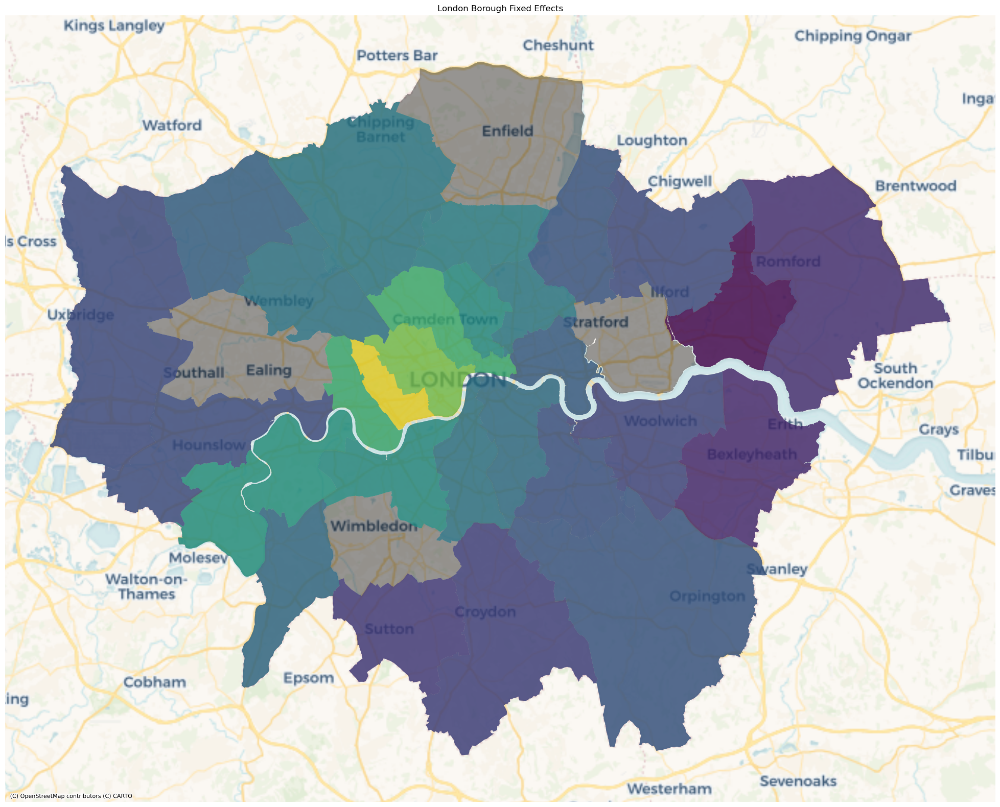

In [72]:
neighborhood_effects['NAME'] = neighborhood_effects.index
f, ax = plt.subplots(1, figsize=(25, 20)) #Subplots allows you to draw multiple plots in one figure
lb.to_crs('EPSG:3857').plot(ax=ax, color='k', alpha=0.4)
lb.merge(neighborhood_effects, how='left',
                    left_on='NAME', 
                    right_on='NAME')\
                  .dropna(subset=['fixed_effect'])\
                  .to_crs('EPSG:3857').plot('fixed_effect',
                        ax=ax, alpha=.7)
ax.set_title("London Borough Fixed Effects")
ax.set_axis_off() #Remove axes from plot 
plt.axis('equal') #Set x and y axes to be equal size
cx.add_basemap(ax, source=cx.providers.CartoDB.Voyager)

This is very interesting, and we can see that there clearly is value in illustrating the heterogeneity in average house price by neighborhood (even when controlling for the characteristics of the houses themselves). However, these fixed effects don't help us to generalize the results very much, i.e., as social scientists we are probably much more interested in finding out what about these neighborhoods is making them so much more attractive, rather than just identifying the fact that some neighborhoods are more attractive than others.

## Spatial Feature Engineering

One way to do this is to engineer some spatial features by directly calculating proximity to various features that we might think are structuring the data systematically. In the case of house prices, distance to the center of London is a valuable - if still relatively general - continuous spatial feature that captures a lot of the economic (i.e., commuting), cultural, and social benefits of being located in the "center of the action." In GeoPandas we can directly calculate the minimum distance from a spatial layer to the closest feature in another layer using the geometry.apply function:

In [73]:
hp_0km = hp2.geometry.apply(lambda x: KM0.distance(x).min()) #KM0 = the central point of London near Trafalgar square
hp_0km.head()

hp_0km.name = "geometry_y"

In [74]:
print(KM0.columns)

Index(['id', 'geometry'], dtype='object')


In [75]:
print(len(hp2))

63501


In [76]:
hp_0km.columns = ['id', 'geometry']
hp_0km.iloc[0:10]

0        21711.438279
13649    21711.438279
14819    21711.438279
1         2831.625927
78        2831.625927
2         2552.221459
66        2552.221459
86        2646.554681
119       2646.554681
121       2552.221459
Name: geometry_y, dtype: float64

Then we join this table of distances back to our housing points:

In [77]:
hp_0km_2 = pd.merge(hp2, hp_0km, left_index=True, right_index=True)
hp_0km_3 = hp_0km_2.rename(index=str, columns={"geometry_y":"Dist_0KM", "geometry_x":"geometry"})
hp_0km_3.head()

,postcode,price,dateoftransfer,propertytype,oldnew,duration,categorytype,recordstatus,year,tfarea,numberrooms,priceper,pcd,pcd2,dointr,doterm,road_dist,Dist_Transit,Dist_OpenSpace,Dist_School,geometry,log_price,sqrt_Dist_School,dist_road,Dist_Road,index_right,geo_code,label,NAME_2,POP,POPDENS,HH,HECTARES,DEPRHH,EMPRES,STUDENT,PROFSCI,Trees,TreeDens,residual,Dist_0KM
0,CR30EA,252000.0,2017-10-26,T,N,F,A,A,2017.0,68.00,4.0,3705.882353,CR3 0EA,CR3 0EA,198001.0,NaN,15.207139,497.833044,293.701585,274.606198,POINT (533695.000 158978.000),12.437184,16.571246,15.207139,15.207139,18358,E00005337,E92000001E09000008E00005337,Croydon,301.0,20.35159,119.0,14.79,0.478992,158,0.050926,0.097561,0.0,0.000000,-0.672831,21711.438279
13649,CR30EA,315000.0,2017-04-06,T,N,F,A,A,2017.0,77.00,4.0,4090.909091,CR3 0EA,CR3 0EA,198001.0,NaN,15.207139,497.833044,293.701585,274.606198,POINT (533695.000 158978.000),12.660328,16.571246,15.207139,15.207139,18358,E00005337,E92000001E09000008E00005337,Croydon,301.0,20.35159,119.0,14.79,0.478992,158,0.050926,0.097561,0.0,0.000000,1.236388,21711.438279
14819,CR30EA,315000.0,2017-07-24,T,N,F,A,A,2017.0,73.85,3.0,4265.402844,CR3 0EA,CR3 0EA,198001.0,NaN,15.207139,497.833044,293.701585,274.606198,POINT (533695.000 158978.000),12.660328,16.571246,15.207139,15.207139,18358,E00005337,E92000001E09000008E00005337,Croydon,301.0,20.35159,119.0,14.79,0.478992,158,0.050926,0.097561,0.0,0.000000,0.569371,21711.438279
1,EC2Y8DD,1775000.0,2017-01-16,F,N,L,A,A,2017.0,106.03,5.0,16740.545129,EC2Y8DD,EC2Y 8DD,198001.0,NaN,641.116330,366.098660,9.839361,128.081099,POINT (532418.000 181908.000),14.389311,11.317292,641.116330,641.116330,12125,E00000017,E92000001E41000324E00000017,City of London,290.0,171.59760,142.0,1.69,0.330986,158,0.071429,0.356250,8.0,4.733728,-0.046814,2831.625927
78,EC2Y8NB,1950000.0,2017-10-06,F,N,L,A,A,2017.0,114.00,4.0,17105.263158,EC2Y8NB,EC2Y 8NB,199208.0,NaN,641.116330,366.098660,9.839361,128.081099,POINT (532418.000 181908.000),14.483340,11.317292,641.116330,641.116330,12125,E00000017,E92000001E41000324E00000017,City of London,290.0,171.59760,142.0,1.69,0.330986,158,0.071429,0.356250,8.0,4.733728,0.380441,2831.625927


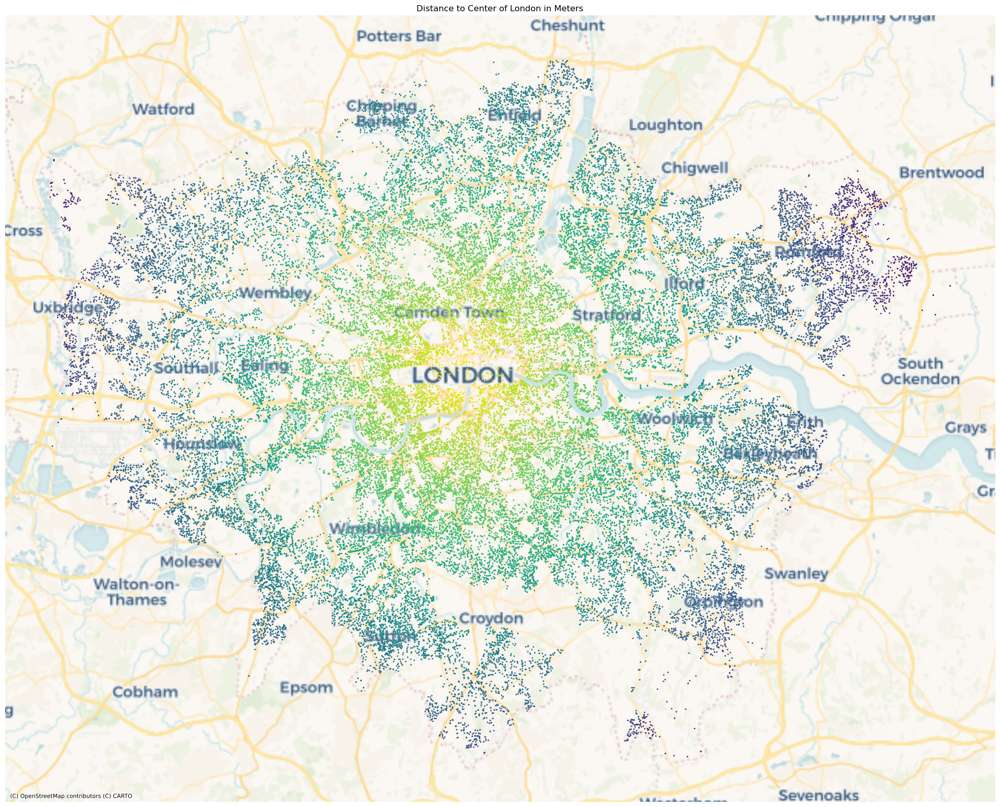

In [78]:
color_map = plt.cm.get_cmap('viridis')
reversed_color_map = color_map.reversed()
f, ax = plt.subplots(1, figsize=(25, 20)) #Subplots allows you to draw multiple plots in one figure
hp_0km_3.to_crs('EPSG:3857').plot('Dist_0KM', cmap=reversed_color_map, marker='.', s=5, ax=ax)
ax.set_axis_off() #Remove axes from plot 
ax.set_title('Distance to Center of London in Meters') #Plot title text
plt.axis('equal') #Set x and y axes to be equal size
cx.add_basemap(ax, source=cx.providers.CartoDB.Voyager)

Compare this to the maps of neighborhood fixed effects and spatial hotspots of model residuals above - it certainly seems that distance to city center might be an important variable structuring the pattern in housing price! Let's see how it behaves when we insert in into the original model specification:

In [79]:
base_names = variable_names
dist_names = variable_names + ['Dist_0KM']

In [80]:
m3 = spreg.OLS(hp_0km_3[['log_price']].values, hp_0km_3[dist_names].values,
                name_y='log_price', name_x=dist_names, robust='white')
print(m3.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :   log_price                Number of Observations:       63501
Mean dependent var  :     13.1055                Number of Variables   :           3
S.D. dependent var  :      0.5654                Degrees of Freedom    :       63498
R-squared           :      0.1423
Adjusted R-squared  :      0.1422
Sum squared residual:     17409.3                F-statistic           :   5266.1149
Sigma-square        :       0.274                Prob(F-statistic)     :           0
S.E. of regression  :       0.524                Log likelihood        :  -49017.164
Sigma-square ML     :       0.274                Akaike info criterion :   98040.329
S.E of regression ML:      0.5236                Schwarz criterion     :   98067.505

White Standard Errors
--------------------------------------

Here it is highly-significant and (interestingly) pulls out the same negative effect for 'Flats' that we saw with the inclusion of neighborhood fixed effects, and we've also been able to explain a lot more variation in (adjusted R-squared is now .6352). Let's check the spatial clustering of the model residuals, since our diagnostics still indicate significant lack of normality:

<Axes: >

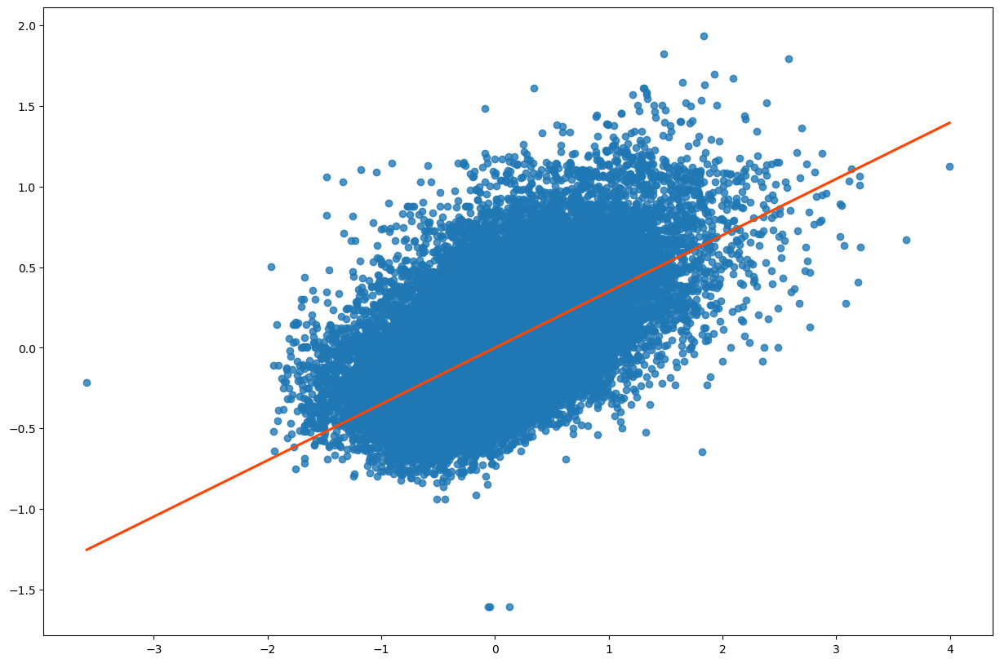

In [81]:
lag_residual = weights.spatial_lag.lag_spatial(w, m3.u)
seaborn.regplot(
    x=m3.u.flatten(), 
    y=lag_residual.flatten(), 
    line_kws=dict(color='orangered'),
    ci=None,
)

Now we see a much more linear relationship, but still a very strong one. Clearly there is still a strong spatial pattern to the model predictions; large residuals in one unit tend to be surrounded by large residuals in its neighbors, and vice-versa. Let's include a few other features of interest to make the model specification really robust, including distance to primary roads, transit stations, and open space that I pre-calculated earlier, as well as the % of households with at least one deprivation dimension ('DEPRHH'):

In [82]:
hp_0km_3["Dist_Road"] = pd.to_numeric(hp_0km_3["Dist_Road"])
all_names = dist_names + ["Dist_Road"] + ['Dist_Transit'] + ['Dist_OpenSpace'] + ['DEPRHH']
all_names

['sqrt_Dist_School',
 'Dist_0KM',
 'Dist_Road',
 'Dist_Transit',
 'Dist_OpenSpace',
 'DEPRHH']

In [83]:
m4 = spreg.OLS(hp_0km_3[['log_price']].values, hp_0km_3[all_names].values,
                name_y='log_price', name_x=all_names, robust='white')
print(m4.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :        None
Dependent Variable  :   log_price                Number of Observations:       63501
Mean dependent var  :     13.1055                Number of Variables   :           7
S.D. dependent var  :      0.5654                Degrees of Freedom    :       63494
R-squared           :      0.3530
Adjusted R-squared  :      0.3529
Sum squared residual:     13132.8                F-statistic           :   5772.7851
Sigma-square        :       0.207                Prob(F-statistic)     :           0
S.E. of regression  :       0.455                Log likelihood        :  -40067.021
Sigma-square ML     :       0.207                Akaike info criterion :   80148.041
S.E of regression ML:      0.4548                Schwarz criterion     :   80211.453

White Standard Errors
--------------------------------------

We continue to improve the model fit, although we can see that the multicollinearity in our model is increasing pretty substantially as well. From an explanatory urban planning perspective, these new variables offer a lot of substantive interest: increasing distance to major roads increases average housing price (holding all other factors constant), meaning that proximity to major roads is a negative externality for housing price, as is the percentage of deprived households (a general indicator of socioeconomic status). On the other hand, proximity to transit stations and open spaces significantly increase average housing price.

<Axes: >

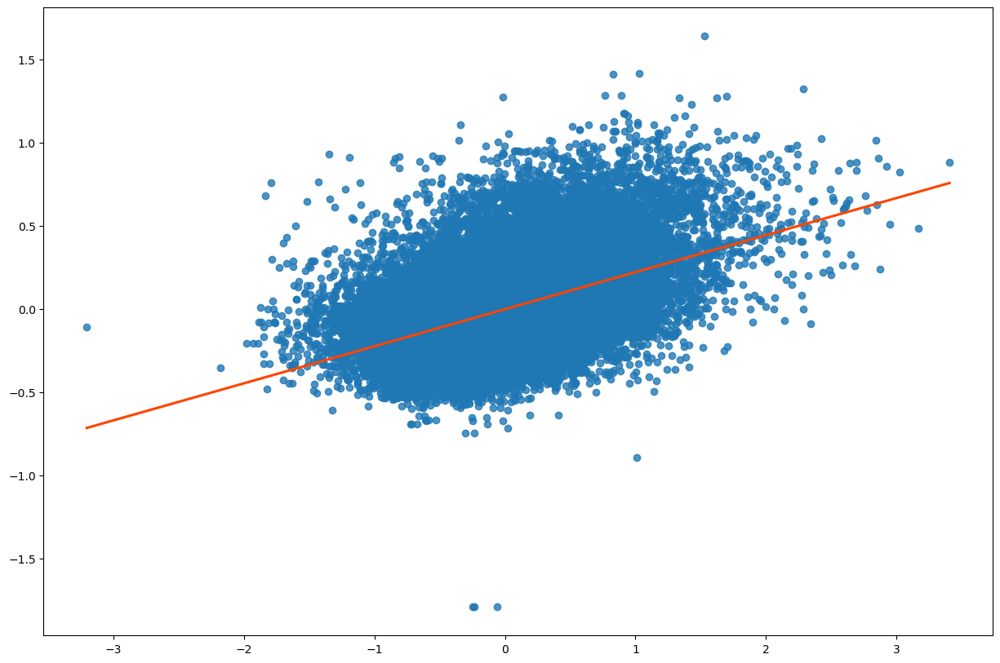

In [84]:
lag_residual = weights.spatial_lag.lag_spatial(w, m4.u)
seaborn.regplot(
    x=m4.u.flatten(), 
    y=lag_residual.flatten(), 
    line_kws=dict(color='orangered'),
    ci=None,
)

We still see signs of residual spatial structure in the residuals! As we have pretty much exhausted our non-spatial remedies at this point, it is likely time to employ an explicitly spatial regression specification.

# Spatial Regression Specifications

## Spatial Diagnostics

We can test the need for a spatial regression formally with several spatial regression diagnostics available in spreg. If we provide the model with a spatial weights matrix (
), we can calculate the residual Moran's that we've been plotting here (which is an indicator of residual spatial error in the specification), as well as the robust Lagrange Multipliers for the spatial lag, spatial error, and spatial lag + error models:

In [85]:
m4 = spreg.OLS(hp_0km_3[['log_price']].values, hp_0km_3[all_names].values,
                name_y='log_price', name_x=all_names, robust='white', w=w, spat_diag=True, moran=True)
print(m4.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :   log_price                Number of Observations:       63501
Mean dependent var  :     13.1055                Number of Variables   :           7
S.D. dependent var  :      0.5654                Degrees of Freedom    :       63494
R-squared           :      0.3530
Adjusted R-squared  :      0.3529
Sum squared residual:     13132.8                F-statistic           :   5772.7851
Sigma-square        :       0.207                Prob(F-statistic)     :           0
S.E. of regression  :       0.455                Log likelihood        :  -40067.021
Sigma-square ML     :       0.207                Akaike info criterion :   80148.041
S.E of regression ML:      0.4548                Schwarz criterion     :   80211.453

White Standard Errors
--------------------------------------

All of our spatial diagnostic tests are highly-significant, which suggests that there is both significant spatial dependence and spatial error in the model specifications. While both may be present in a given model, Anselin and Rey (2014) suggest that usually one type of spatial dependence is predominant, so we'll estimate each of the basic spatial regression models in turn and compare the results.
Spatial Lag of X Model (SLX)

The most striaghtforward way to introduce spatial dependence directly into the regression specification is to calculate and include the spatial lags of the

variables in the basic regression framework:

where is the spatial weights matrix and

is the set of spatial lag coefficients for the independent variables. This model can be estimated using OLS because the spatial lags don't violate any of the basic assumptions (as other spatial models do) - they are essentially additional exogenous variables. For this reason, we could also consider this model a kind of extension of the "spatial feature engineering" approach.

Recall that the fundamental purpose of accounting for spatial dependence in our model is to try to understand how spatial structure plays a role in determining variation in

. A very common way for this to occur is through spatial spillovers from the covariates - in our example, this might mean that the price of a given house is determined not only by the number of rooms of the house itself, but also by the average number of rooms in neighboring houses.

We can implement this model by using PySAL's lag_spatial function and renaming with an added 'w_' as a prefix:

In [86]:
wx = hp_0km_3[variable_names].apply(
    lambda y: weights.spatial_lag.lag_spatial(w, y)
# Rename the spatial lag, adding w_ to the original name
).rename(
    columns=lambda c: 'w_'+c)
# Compute the spatial lag of each of those variables
wx

,w_sqrt_Dist_School
0,19.098840
13649,19.098840
14819,19.098840
1,11.596344
78,11.596344
...,...
63485,13.448423
63494,22.023538
63499,22.023538
63495,20.800015


In [87]:
# Merge original variables with the spatial lags in `wx`
slx_exog = hp_0km_3[all_names].join(wx)
m5 = spreg.OLS(hp_0km_3[['log_price']].values, slx_exog.values,
                name_y='log_price', name_x=slx_exog.columns.tolist(), robust='white', w=w, spat_diag=True, moran=True)
print(m5.summary)

REGRESSION RESULTS
------------------

SUMMARY OF OUTPUT: ORDINARY LEAST SQUARES
-----------------------------------------
Data set            :     unknown
Weights matrix      :     unknown
Dependent Variable  :   log_price                Number of Observations:       63501
Mean dependent var  :     13.1055                Number of Variables   :           8
S.D. dependent var  :      0.5654                Degrees of Freedom    :       63493
R-squared           :      0.3531
Adjusted R-squared  :      0.3531
Sum squared residual:     13129.2                F-statistic           :   4951.8565
Sigma-square        :       0.207                Prob(F-statistic)     :           0
S.E. of regression  :       0.455                Log likelihood        :  -40058.341
Sigma-square ML     :       0.207                Akaike info criterion :   80132.682
S.E of regression ML:      0.4547                Schwarz criterion     :   80205.152

White Standard Errors
--------------------------------------

Let's dive into these results in a little more depth. If we go back to our equation for the SLX model, we can see that describes the change in a particular unit's (let's subscript as ) () when - that unit's value for explanatory variable increases by one. We call this the direct effect. , on the other hand, represents the indirect effect, which can be interpreted either as the change in when increases by one (the neighbors of being designated here as ) or the change in when

increases by one (as LeSage and Pace (2009, p. 37) show, average indirect impact to and from an obersvation are numerically equivalent). The interpretation depends largely on the veiwpoint of the research question.

You may have noticed that in this case we've only computed the spatial lags of the characteristics of the houses themselves rather than the spatial features. While these lags can also be computed, interpretation of these indirect effects is more difficult - what exactly would the change in
when increases by one mean after controlling for the change in when increases by one? Since and

are, by definition, near one another, 'w_Dist_0km' and 'Dist_0km' are likely to be so collinear as to render the interpretation meaningless (or highly difficult).

Now, if we compare the results of the direct effects to our previous model, the significances and directions of effect all basically match, other than for 'Dist_Transit'. This suggests that some of the variance in
explained by that variable may have been better explained by accounting for the characteristics of the houses in the neighborhood or may be moderated by these characteristics. In other words, it's possible that while being closer to transit is a raw benefit to house price overall, it has a negative effect on houses of higher quality. We can explore this relationship directly by making an interaction plot - here we're looking at the relationship between 'Dist_Transit' and for high (above median) and low (below median) values of 'w_Detached':

In [95]:
print(hp_0km_3.columns)

Index(['postcode', 'price', 'dateoftransfer', 'propertytype', 'oldnew',
       'duration', 'categorytype', 'recordstatus', 'year', 'tfarea',
       'numberrooms', 'priceper', 'pcd', 'pcd2', 'dointr', 'doterm',
       'road_dist', 'Dist_Transit', 'Dist_OpenSpace', 'Dist_School',
       'geometry', 'log_price', 'sqrt_Dist_School', 'dist_road', 'Dist_Road',
       'index_right', 'geo_code', 'label', 'NAME_2', 'POP', 'POPDENS', 'HH',
       'HECTARES', 'DEPRHH', 'EMPRES', 'STUDENT', 'PROFSCI', 'Trees',
       'TreeDens', 'residual', 'Dist_0KM'],
      dtype='object')


# ERRORS HERE DUE TO NOT HAVING w_Detached

In [89]:
slx_exog2 = slx_exog.join(hp_0km_3[['log_price']])
slx_exog2['w_Detached_m'] = slx_exog2.w_Detached > slx_exog2.w_Detached.median()
slx_exog2['w_Detached_m'] = np.where(slx_exog2.w_Detached_m == False, "Below Median", "Above Median")
seaborn.lmplot(x='Dist_Transit', y='log_price', hue='w_Detached_m', data=slx_exog2, aspect=1,  scatter_kws={'alpha': 0.05, 's': 50})

AttributeError: 'DataFrame' object has no attribute 'w_Detached'

As we suspected, 'Dist_Transit' is much more negatively related to for houses with lower proportions of detached homes in their immediate neighborhood (500 meters, in this case); for houses with larger proportions of detached homes in their immediate neighborhood, distance to transit is nearly positively related (i.e., a nusiance effect). In fact, we can calculate an interaction term between these variables for use in later specifications if we want to:

In [ ]:
slx_exog['Interaction'] = slx_exog.Dist_Transit*slx_exog.w_Detached

We can also see that the SLX specification has slightly lowered the residual spatial error in the model and both reduced the significance of the Robust lag Lagrange Multiplier and increased the Adjusted-

, which suggests that inclusion of the spatial lags has further identified some of the spatial dependence in the relationships between our variables here.
Spatial Lag Model (SAR)

The spatial lag model is used in cases where we assume there is spatial dependence or contagion in the dependent variable; in other words, cases where one unit's values are directly spilling-over to influence neighboring units. The specification of the spatial lag model generally is:

where is the spatial weights matrix and is the spatial lag coefficient. In this case, we could interpret the spatial spillover process as some sort of social contagion where people set their house prices explicitly based on the prices of neighboring prices. In terms of mathematical estimation, it is probably obvious that the

term on both sides of the equation violates the exogeneity assumption of OLS. There are various ways to estimate this equation (including Maximum Likelihood) available in PySAL, but here we'll use the General Method of Moments (GMM) technique of Anselin (1988) which handles this endogeneity using a Two-Stage Least Squares (2SLS) approach, using the spatial lag of all explanatory variables as instruments for the endogenous lag variable:


In [ ]:
m6 = spreg.GM_Lag(hp_0km_3[['log_price']].values, hp_0km_3[all_names].values,
                     w=w, name_y='log_price', name_x=all_names, robust='white')
print(m6.summary)

As you can see, the spatial lag parameter is significant and positive, indicating positive spatial dependence in the dependent variable. The other coefficients remain significant in this specification; however, based on the spatial diagnostics above, we might still assume that there is some residual spatial error in the model.
Spatial Error Model (SEM)

The spatial error model is used in cases where we assume there is residual spatial error in the specification of the model. This can come from a variety of sources, including: omitted spatially-structured variables, from measuring the dependent variable at a different spatial scale than the one at which it naturally occurs, or from a mismatch between the scale of predictor variables and the outcome variable. Consequently, there is often a less clear interpretation of the meaning of the spatial lag operator; it is included as a control for bias arising from spatial mis-specification. The specification of the spatial error model generally is:

This is essentially a partitioning of the full error term into a spatially-structured portion (with inserted into the estimation, where is the spatial error coefficient) and a remaining random portion (). Since the SEM does not involve spatial lags of the dependent variable, the estimates for parameters can be interpreted in the usual regression sense (as partial derivatives). Of course, these models do not allow for indirect impacts to come from changes in the explanatory variables, similar to the case in standard OLS.

In [ ]:
m7 = spreg.GM_Error_Het(hp_0km_3[['log_price']].values, hp_0km_3[all_names].values,
                     w=w, name_y='log_price', name_x=all_names)
print(m7.summary)

As we can see, is highly-significant and large, and, interestingly has had some effect on the other coefficients. 'Dist_Transit' and 'Dist_OpenSpace' are no longer significant after controlling for residual spatial error, which supports our assumptions previously that significance for these variables may have simply been a by-product of the spatial structure of the region (or the scale at which housing process correlate, etc.) rather than the variables themselves.

In [ ]:
m8 = spreg.GM_Error_Het(slx_exog2[['log_price']].values, slx_exog.values,
                     w=w, name_y='log_price', name_x=slx_exog.columns.tolist())
print(m8.summary)

# Spatial Regimes Models

As we have seen consistently throughout this practical, there is significant neighborhood-level heterogeneity evident in housing prices. We ultimately decided to use the spatial regression approach to better explain this heterogeneity in terms of general variable relationships while also controlling for residual spatial error in the SEM model. However, another approach that we might use is to explicitly try to explain this heterogeneity by breaking our data into "spatial regimes" (or sub-areas). The idea here is that we have identified significant heterogeneity by neighborhood, and while we can control for the differences in average housing price by neighborhood with fixed effects, we might be more interested in how the relationships between the covariates and housing price vary by neighborhood.

To model these spatial regimes, we essentially subset the dataset by regime and run separate regressions for each, observing changing variable relationships, significances, etc., in order to better understand how the important predictors of housing price vary by neighborhood. With our best-fit specification for the full (pooled) model chosen (SEM), we can then subset neighborhoods and run individual regressions for these regimes. Here are the results for Camden, near the center of the city:

In [ ]:
hpcam = hp_0km_3[(hp_0km_3["NAME_2"]=="Camden")]
wcam = weights.DistanceBand.from_dataframe(hpcam, 500)
m7cam = spreg.GM_Error_Het(hpcam[['log_price']].values, hpcam[all_names].values,
                     w=wcam, name_y='log_price', name_x=all_names)
print(m7cam.summary)

And for Barking and Dagenham, near the outskirts of the city:

In [ ]:
hpbd = hp_0km_3[(hp_0km_3["NAME_2"]=="Barking and Dagenham")]
wbd = weights.DistanceBand.from_dataframe(hpbd, 500)
m7bd = spreg.GM_Error_Het(hpbd[['log_price']].values, hpbd[all_names].values,
                     w=wbd, name_y='log_price', name_x=all_names)
print(m7bd.summary)

As you can see, there are some interesting differences in the relationships between these two boroughs. For instance, 'Dist_Transit' is not significant in Barking and Dagenham, but is mildly significant (at

) in Camden. It could be the case that in some outlying neighborhoods, residents largely rely on cars for transportation, meaning that transit availability does pattern the structure of housing values; or perhaps all of the transit stations in our dataset are just too far from Barking and Dagenham to be of much use (and thus of value for determining housing prices). More work must be done to fully interpret these results (and to understand whether more variables must be collected to better get at the relationships of interest).

While these regressions are powerful tools (when properly specified and applied) for understanding the relationships between variables, they are only one piece of the overall picture of explaining and understanding spatial processes and making an argument in favor of particular relationships.
